In [1]:
from transformers import ViTMAE3DConfig, ViTMAE3DForPreTraining

# load model
model = ViTMAE3DForPreTraining.from_pretrained('./pretrained_vit_mae_3d_25pct_50_epochs_20230613-155327')
model = model.cuda()
# inference
model.eval()

/home/minghui/github/transformers/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2023-06-13 15:53:49.352838: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-06-13 15:53:49.352879: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-06-13 15:53:49.352882: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentio

ViTMAE3DForPreTraining(
  (vit): ViTMAE3DModel(
    (embeddings): ViTMAE3DEmbeddings(
      (patch_embeddings): ViTMAE3DPatchEmbeddings(
        (projection): Conv3d(1, 768, kernel_size=(7, 7, 7), stride=(7, 7, 7))
      )
    )
    (encoder): ViTMAE3DEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTMAE3DLayer(
          (attention): ViTMAE3DAttention(
            (attention): ViTMAE3DSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTMAE3DSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTMAE3DIntermediate(
            (dense): Linear(in_features=768,

In [2]:
import re
import os
import csv
import numpy as np
import torch
from einops import rearrange
from torch.utils.data import Dataset
from monai.data import NibabelReader

class SPRINT_T1w_flat_Dataset:
    def __init__(self, data_dir, filenames, subjects_csv, mode='train', transform=None):
        self.data_dir = data_dir
        # read all nifti files in data_dir
        self.filenames = filenames
        self.transform = transform
                
        # read labels of each subject
        self.labels = {}
        with open(subjects_csv, "r") as fp:
            csv_reader = csv.reader(fp, delimiter=",")
            for row in csv_reader:
                if row[0] == "subject_id":
                    continue
                id = row[0]
                label = int(row[4])
                self.labels[id] = label

        # count how many label == 1
        progress = 0
        not_progress = 0
        for filename in self.filenames:
            id = re.search(r'subject_(\d{3})-(\d{4})', filename).group(2)
            if self.labels[id] == 1:
                progress += 1
            else:
                not_progress += 1
        print(f"Total subjects: {len(self.filenames)}, Progressing: {progress}, Not progressing: {not_progress}")

        # create image reader
        self.image_reader = NibabelReader()

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        # get subject id from filename using regex
        id = re.search(r'subject_(\d{3})-(\d{4})', filename).group(2)
        image = self.image_reader.read(os.path.join(self.data_dir, filename))
        
        image = image.get_fdata().astype(np.float32)
        image = torch.from_numpy(image)
        # leave only middle 91 channels in dimension 1
        image = image[:, 9:100, :]
        if self.transform:
            image = self.transform(image)
        image = rearrange(image, 'd h w -> 1 d h w')
        label = self.labels[id]

        return {'image': image, 'label': label}

In [3]:
from typing import Any
from torch.utils.data import DataLoader
import torchvision.transforms as T

# open files.txt which contains all the file paths
with open('/home/minghui/github/NMSS/vitmae/files.txt', 'r') as f:
    files = f.readlines()
files = [x.strip() for x in files]

data_dir = '/media/minghui/Data/Datasets/NMSS Study/yuxin/agg_normalized/'
label_csv = '/home/minghui/github/NMSS/vitmae/subject_list.csv'

# custom torch transform to select num_channels random channels
class RandomChannelSelect:
    def __init__(self, num_channels=8):
        self.num_channels = num_channels

    def __call__(self, img):
        # img is a 4D tensor of shape (1, C, H, W)
        # randomly select a starting channel
        start_channel = np.random.randint(0, img.shape[0] - self.num_channels)
        img = img[start_channel:start_channel+self.num_channels, :, :]
        return img

class RandomCrop3D:
    def __init__(self, size=64):
        self.size = size
    
    def __call__(self, img):
        # img is a 3D tensor of shape (x, y, z)
        # randomly select a starting channel
        x_start = np.random.randint(0, img.shape[0] - self.size)
        y_start = np.random.randint(0, img.shape[1] - self.size)
        z_start = np.random.randint(0, img.shape[2] - self.size)
        img = img[x_start:x_start+self.size, y_start:y_start+self.size, z_start:z_start+self.size]
        return img

class RandomDimensionPermute:
    def __init__(self):
        pass

    def __call__(self, img):
        # img is a 4D tensor of shape (1, C, H, W)
        # randomly permute the dimensions
        dims = ['x', 'y', 'z']
        np.random.shuffle(dims)
        img = rearrange(img, 'x y z -> {}'.format(' '.join(dims)))
        return img

train_transforms = T.Compose([
    # RandomCrop3D(64),
    # RandomDimensionPermute(),
    # RandomChannelSelect(16),
    # T.RandomHorizontalFlip(),
    # T.RandomVerticalFlip(),
    # T.RandomAffine(15, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=(-10, 10, -10, 10)),
    # T.RandomAdjustSharpness(0.5),
    # T.GaussianBlur(3, sigma=(0.1, 0.5)),
    # T.RandomRotation(90),
    # T.RandomCrop(64),
])

train_dataset = SPRINT_T1w_flat_Dataset(data_dir, files, label_csv, mode='train', transform=None)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)

for batch in train_loader:
    image = batch['image']
    print(image.shape)
    label = batch['label']
    break

Total subjects: 751, Progressing: 326, Not progressing: 425
torch.Size([8, 1, 91, 91, 91])


torch.Size([1, 1, 91, 91, 91])
odict_keys(['loss', 'logits', 'mask', 'ids_restore'])
loss: tensor(245.6648, device='cuda:0')
logits shape:  torch.Size([1, 2197, 343])
mask shape:  torch.Size([1, 2197])
2023-06-13 15:53:58,717 - Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
2023-06-13 15:53:58,719 - MovieWriter._run: running command: convert -size 640x480 -depth 8 -delay 10.0 -loop 0 rgba:- -layers OptimizePlus original.gif
2023-06-13 15:54:04,726 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


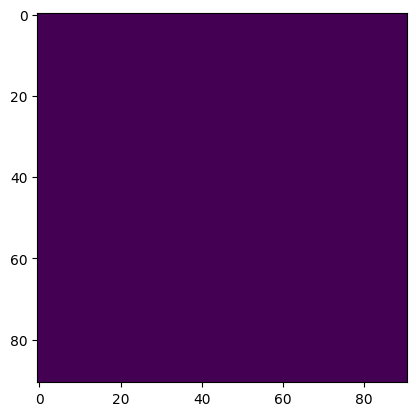

In [4]:
# take a random image from dataset
import matplotlib.pyplot as plt
import random
import matplotlib.animation as animation
from IPython.display import HTML

random_idx = random.randint(0, len(train_dataset))
datum = train_dataset[random_idx]

# convert to tensor
image = datum['image']
image = rearrange(image, 'c d h w -> 1 c d h w')
image = image.cuda()
print(image.shape)

with torch.no_grad():
    output = model(image)
print(output.keys())

print('loss:', output['loss'])
print('logits shape: ', output['logits'].shape)
print('mask shape: ', output['mask'].shape)


# animate original images
fig = plt.figure()
ims = []
temp = image.squeeze().cpu().numpy()
for i in range(91):
    im = plt.imshow(temp[:, :, i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
# save animation on disk
ani.save('original.gif', writer='imagemagick', fps=10)
# show the animation
HTML(ani.to_jshtml())

(91, 91, 91)
2023-06-13 15:54:13,802 - Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
2023-06-13 15:54:13,803 - MovieWriter._run: running command: convert -size 640x480 -depth 8 -delay 10.0 -loop 0 rgba:- -layers OptimizePlus mask.gif
2023-06-13 15:54:15,818 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


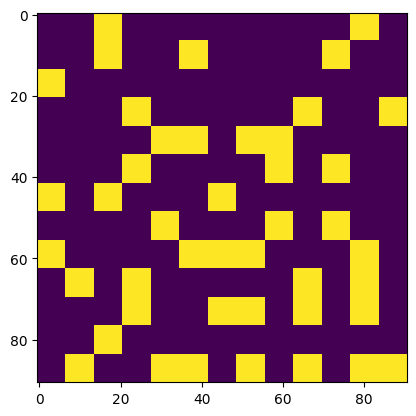

In [5]:
# animate the mask
from einops import repeat
# visualize the mask
mask = output['mask']
mask = rearrange(mask, 'n c -> n c 1')
mask = repeat(mask, 'n c 1 -> n c d', d = 7 * 7 * 7)
mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
mask = rearrange(mask, 'n c d h w -> n d h w c')
mask = mask.squeeze(0).squeeze(-1).detach().cpu().numpy()
print(mask.shape)

fig = plt.figure()
ims = []
for i in range(64):
    im = plt.imshow(mask[: ,:, i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
# save animation on disk
ani.save('mask.gif', writer='imagemagick', fps=10)
# show the animation
HTML(ani.to_jshtml())

2023-06-13 15:54:21,062 - Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
2023-06-13 15:54:21,063 - MovieWriter._run: running command: convert -size 640x480 -depth 8 -delay 10.0 -loop 0 rgba:- -layers OptimizePlus masked_image.gif
2023-06-13 15:54:26,270 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


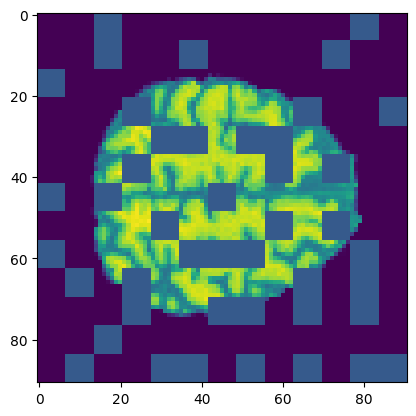

In [6]:
# animate the masked out image
im_masked = temp * (1 - mask)

fig = plt.figure()
ims = []
for i in range(64):
    im = plt.imshow(im_masked[:,:,i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
# save animation on disk
ani.save('masked_image.gif', writer='imagemagick', fps=10)
# show the animation
HTML(ani.to_jshtml())
    

2023-06-13 15:54:40,622 - Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
2023-06-13 15:54:40,623 - MovieWriter._run: running command: convert -size 640x480 -depth 8 -delay 10.0 -loop 0 rgba:- -layers OptimizePlus logits.gif
2023-06-13 15:54:47,486 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


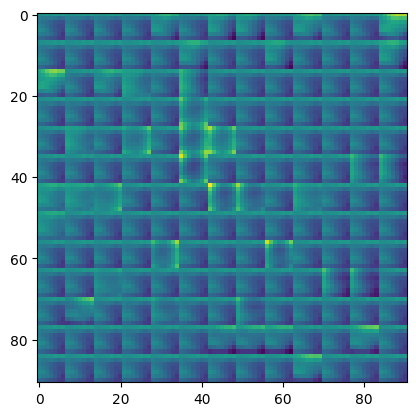

In [7]:
# animate logits

# reshape logits back to 3d
logits = output['logits']
# unpatchify logits
logits = model.unpatchify(logits)
logits = logits.cpu().numpy()
logits = rearrange(logits, ' n c d h w -> (n c) d h w')
logits = logits.squeeze()


fig = plt.figure()
ims = []
for i in range(91):
    im = plt.imshow(logits[:,:,i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
# save animation on disk
ani.save('logits.gif', writer='imagemagick', fps=10)
# show the animation
HTML(ani.to_jshtml())

2023-06-13 15:55:23,438 - Animation.save using <class 'matplotlib.animation.ImageMagickWriter'>
2023-06-13 15:55:23,438 - MovieWriter._run: running command: convert -size 640x480 -depth 8 -delay 10.0 -loop 0 rgba:- -layers OptimizePlus overlay.gif
2023-06-13 15:55:30,480 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


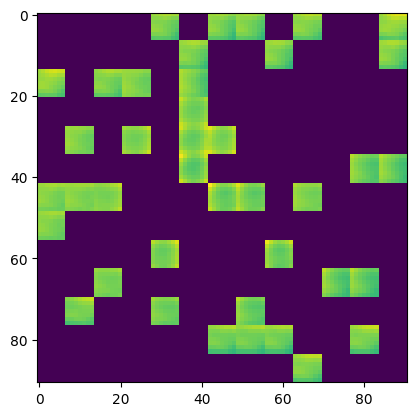

In [8]:
# overlay the original image with the logits
im_paste = logits * mask + temp * (1 - mask)

fig = plt.figure()
ims = []
for i in range(91):
    im = plt.imshow(im_paste[:,:,i], animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)
# save animation on disk
ani.save('overlay.gif', writer='imagemagick', fps=10)
# show the animation
HTML(ani.to_jshtml())   